# EDA

In [1]:
import numpy                 as np
import pandas                as pd
import matplotlib.pyplot     as plt
import seaborn               as sns
import sklearn.metrics       as Metrics
import pandas                as pd
import matplotlib            as mpl


import folium  
from folium.plugins import HeatMap
import geopandas
import branca

In [2]:
import json
import requests
import os
import calendar
import datetime

In [3]:
# set matplotlib defaults
%matplotlib inline
sns.set()
plt.rcParams["figure.figsize"] = (15,6)
mpl.rc('axes', labelsize=18)
mpl.rc('xtick', labelsize=16)
mpl.rc('ytick', labelsize=16)
plt.rc('figure', titlesize=18)
plt.style.use('seaborn-darkgrid')

## Data loading and preparation

In [4]:
# read dataset
data_folder = '../data'
accidents_file = os.path.join(data_folder, 'siniestros_bogota_historico.csv')
accidents = pd.read_csv(accidents_file,sep=',')
accidents.head()

,X,Y,OBJECTID,FORMULARIO,CODIGO_ACCIDENTE,ANO_OCURRENCIA_ACC,DIRECCION,GRAVEDAD,CLASE_ACC,LOCALIDAD_GEO,LOCALIDAD,FECHA_HORA_ACC,CIV,PK_CALZADA
0,-74.039690,4.759877,1001,A00728405,360471,2010,AK 18A-CL 182 58,SOLO DANOS,CHOQUE,USAQUEN,USAQUEN,2010-05-25T20:10:00.000Z,1007130.0,91019224.0
1,-74.114296,4.615476,1002,A00408972,305838,2008,TR 49-3 02,SOLO DANOS,CHOQUE,PUENTE ARANDA,PUENTE ARANDA,2008-09-30T07:00:00.000Z,16004607.0,195361.0
2,-74.105296,4.509792,1003,A000341903,4437952,2016,CL 80A-KR 1 SE 02,CON HERIDOS,CHOQUE,USME,USME,2016-02-27T16:20:00.000Z,5002841.0,149316.0
3,-74.167225,4.631051,1004,A000554581,4472304,2017,AV AVENIDA CIUDAD DE CALI-CL 42 S 02,CON HERIDOS,ATROPELLO,KENNEDY,KENNEDY,2017-02-09T16:45:00.000Z,8004447.0,66217.0
4,-74.121790,4.603106,1005,A000763908,4512837,2018,AV AVENIDA PRIMERA DE MAYO-KR 50A 14,CON HERIDOS,CHOQUE,PUENTE ARANDA,PUENTE ARANDA,2018-03-25T12:10:00.000Z,16003102.0,239094.0


In [5]:
# Column renaming
cols = ['x', 'y', 'object_id', 'form', 'accident_id', 'year' , 
        'adress', 'severity', 'accident_type', 'borough_geo', 
        'borough', 'timestamp', 'civ', 'pk']
accidents.columns = cols
accidents.timestamp = pd.to_datetime(accidents.timestamp, infer_datetime_format=True)

In [6]:
accidents.head(3)

,x,y,object_id,form,accident_id,year,adress,severity,accident_type,borough_geo,borough,timestamp,civ,pk
0,-74.039690,4.759877,1001,A00728405,360471,2010,AK 18A-CL 182 58,SOLO DANOS,CHOQUE,USAQUEN,USAQUEN,2010-05-25 20:10:00+00:00,1007130.0,91019224.0
1,-74.114296,4.615476,1002,A00408972,305838,2008,TR 49-3 02,SOLO DANOS,CHOQUE,PUENTE ARANDA,PUENTE ARANDA,2008-09-30 07:00:00+00:00,16004607.0,195361.0
2,-74.105296,4.509792,1003,A000341903,4437952,2016,CL 80A-KR 1 SE 02,CON HERIDOS,CHOQUE,USME,USME,2016-02-27 16:20:00+00:00,5002841.0,149316.0


In [7]:
accidents.severity.unique()

array(['SOLO DANOS', 'CON HERIDOS', 'CON MUERTOS', nan], dtype=object)

In [8]:
accidents.accident_type.unique()

array(['CHOQUE', 'ATROPELLO', 'OTRO', 'CAIDA DE OCUPANTE', 'VOLCAMIENTO',
       nan, 'AUTOLESION', 'INCENDIO'], dtype=object)

In [9]:
# Replace names to english
accidents.replace({'SOLO DANOS': 'Material damage', 
                   'CON HERIDOS': 'Injury', 'CON MUERTOS': 'Fatality'}, inplace=True)
accidents.replace({'CHOQUE': 'Crash', 'ATROPELLO': 'Run over', 'OTRO': 'other', 
                   'CAIDA DE OCUPANTE':'Occupant fall', 'VOLCAMIENTO':'Rollover', 'AUTOLESION':'Self injury',
                  'INCENDIO':'Fire'}, inplace=True)

In [10]:
accidents.severity.unique()

array(['Material damage', 'Injury', 'Fatality', nan], dtype=object)

In [11]:
accidents.accident_type.unique()

array(['Crash', 'Run over', 'other', 'Occupant fall', 'Rollover', nan,
       'Self injury', 'Fire'], dtype=object)

In [12]:
print(accidents.borough.unique())

['USAQUEN' 'PUENTE ARANDA' 'USME' 'KENNEDY' 'BARRIOS UNIDOS' 'CHAPINERO'
 'SANTA FE' 'SUBA' 'ENGATIVA' 'CANDELARIA' 'BOSA' 'FONTIBON' 'TEUSAQUILLO'
 'LOS MARTIRES' 'ANTONIO NARIÑO' 'TUNJUELITO' 'RAFAEL URIBE URIBE'
 'SAN CRISTOBAL' 'CIUDAD BOLIVAR' 'SUMAPAZ']


In [13]:
print(accidents.borough_geo.unique())

['USAQUEN' 'PUENTE ARANDA' 'USME' 'KENNEDY' 'BARRIOS UNIDOS' 'CHAPINERO'
 'SANTA FE' 'SUBA' 'ENGATIVA' 'CANDELARIA' 'BOSA' 'FONTIBON' 'TEUSAQUILLO'
 'LOS MARTIRES' 'RAFAEL URIBE URIBE' 'TUNJUELITO' 'SAN CRISTOBAL'
 'ANTONIO NARINO' 'CIUDAD BOLIVAR' 'SUMAPAZ' nan 'CANDELARIO']


In [14]:
# Set difference between borough_geo and borough to spot different names
print(set(accidents.borough_geo.unique()) - set(accidents.borough.unique()))

{nan, 'ANTONIO NARINO', 'CANDELARIO'}


In [15]:
# correct namig differences
dic = {'ANTONIO NARINO': 'ANTONIO NARIÑO', 'CANDELARIO':'CANDELARIA'}
accidents.borough_geo.replace(dic, inplace=True)
print(set(accidents.borough_geo.unique()) - set(accidents.borough.unique()))

{nan}


In [16]:
accidents[accidents.borough != accidents.borough_geo].head(3)

,x,y,object_id,form,accident_id,year,adress,severity,accident_type,borough_geo,borough,timestamp,civ,pk
6,-74.053575,4.644176,1007,727119100,33903,2007,CL 63-0 FRENTE AL PARQUE SIMON BOLIVAR,Injury,other,CHAPINERO,BARRIOS UNIDOS,2007-07-31 07:50:00+00:00,2001553.0,31860.0
11,-74.040962,4.681181,1012,726576300,28509,2007,CL 100-8A 59,Material damage,Crash,CHAPINERO,USAQUEN,2007-06-06 07:35:00+00:00,1005836.0,35247.0
21,-74.089037,4.687408,1022,A00666167,352406,2010,AK 68-CL75 02,Material damage,Crash,ENGATIVA,BARRIOS UNIDOS,2010-02-27 15:30:00+00:00,10007575.0,213515.0


Why are there differences between  ```borough``` and  ```borough_geo```?

### Processing null values

In [17]:
accidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 405348 entries, 0 to 405347
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype              
---  ------         --------------   -----              
 0   x              405348 non-null  float64            
 1   y              405348 non-null  float64            
 2   object_id      405348 non-null  int64              
 3   form           405348 non-null  object             
 4   accident_id    405348 non-null  int64              
 5   year           405348 non-null  int64              
 6   adress         405348 non-null  object             
 7   severity       405345 non-null  object             
 8   accident_type  405165 non-null  object             
 9   borough_geo    405292 non-null  object             
 10  borough        405348 non-null  object             
 11  timestamp      405348 non-null  datetime64[ns, UTC]
 12  civ            403141 non-null  float64            
 13  pk             395246 non-nul

In [18]:
accidents[accidents.borough_geo.isna()]

,x,y,object_id,form,accident_id,year,adress,severity,accident_type,borough_geo,borough,timestamp,civ,pk
43610,-74.200353,4.600041,44611,A000763096,4512183,2018,AV AVENIDA DEL SUR-KR 75 2,Material damage,Crash,NaN,BOSA,2018-03-17 13:10:00+00:00,50006605.0,NaN
51771,-74.189334,4.597365,49772,A000278796,4431414,2015,AV AVENIDA DEL SUR-CL 68B S 12,Material damage,Crash,NaN,BOSA,2015-12-05 18:19:00+00:00,NaN,NaN
57181,-74.184334,4.596344,50182,A000470334,4456641,2016,AV AVENIDA DEL SUR-CL 67 S 05,Material damage,Crash,NaN,BOSA,2016-09-06 07:20:00+00:00,50001542.0,50017280.0
59401,-74.209634,4.605810,63402,A000757148,4506585,2018,AV AVENIDA DEL SUR-KR 78I 50,Injury,Crash,NaN,BOSA,2018-01-28 07:15:00+00:00,NaN,NaN
61759,-74.188436,4.597227,58760,A000041336,4401683,2015,AV AVENIDA DEL SUR-KR 67 02,Material damage,Crash,NaN,BOSA,2015-01-07 07:00:00+00:00,NaN,NaN
92323,-74.189993,4.597511,91324,A000690766,4499762,2017,AV AVENIDA DEL SUR-KR 69 2,Material damage,Crash,NaN,BOSA,2017-11-14 22:45:00+00:00,NaN,NaN
95960,-74.174842,4.684391,90961,A000691373,4502681,2017,CL 13-KR 133 02,Material damage,Crash,NaN,FONTIBON,2017-12-12 15:30:00+00:00,NaN,NaN
105943,-74.193769,4.598334,105944,A000763032,4512019,2018,KR 77G-CL 70B S 2,Injury,Crash,NaN,BOSA,2018-03-20 09:30:00+00:00,NaN,NaN
113310,-74.188844,4.597275,118311,A000758699,4508424,2018,AV AVENIDA DEL SUR-CL 68 S 2,Material damage,Crash,NaN,TUNJUELITO,2018-02-14 06:05:00+00:00,7007820.0,61280.0
118097,-74.184194,4.596409,117098,A000551227,4468691,2016,AV AVENIDA DEL SUR-CL 66 S 02,Material damage,Crash,NaN,BOSA,2016-12-27 13:30:00+00:00,50001542.0,50017280.0


In [19]:
# fill nulls in borough_geo with values of borough
accidents.borough_geo.fillna(accidents.borough, inplace=True)

In [20]:
accidents[accidents.accident_type.isna()]

,x,y,object_id,form,accident_id,year,adress,severity,accident_type,borough_geo,borough,timestamp,civ,pk
125,-74.075536,4.664511,1126,727639900,39096,2007,AV CIUDAD DE QUITO-CL 69 0,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-09-25 20:05:00+00:00,12002045.0,35893.0
9621,-74.064431,4.643908,10622,840010100,292297,2008,CL 57-13 02,Injury,NaN,CHAPINERO,CHAPINERO,2008-06-27 12:25:00+00:00,2002211.0,31778.0
10872,-74.041560,4.779383,11873,728149300,44165,2007,AU NORTE-220 0,Material damage,NaN,USAQUEN,USAQUEN,2007-11-09 18:30:00+00:00,1006455.0,2976.0
11646,-74.069099,4.648431,12647,840141900,293555,2008,AC 60-18A 48,Material damage,NaN,TEUSAQUILLO,CIUDAD BOLIVAR,2008-06-30 01:35:00+00:00,13000403.0,32394.0
16206,-74.089225,4.680316,16207,728093900,43619,2007,KR 69-71,Material damage,NaN,ENGATIVA,ENGATIVA,2007-11-02 17:30:00+00:00,10008472.0,41937.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369661,-74.103390,4.599371,371066,728726100,49377,2007,CL 1A-30,Material damage,NaN,LOS MARTIRES,PUENTE ARANDA,2007-12-29 08:35:00+00:00,14001143.0,240448.0
370833,-74.096357,4.685622,375238,828659300,432,2008,AV BOYACA-CL 70 89,Material damage,NaN,ENGATIVA,ENGATIVA,2008-01-12 19:10:00+00:00,10007937.0,42191.0
370912,-74.071954,4.668912,375317,728000500,42690,2007,AV CIUDAD DE QUITO-CL 74,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-10-26 11:15:00+00:00,12001580.0,38055.0
375972,-74.062777,4.645109,377377,833950800,3831,2008,CL 59-SUR 2,Material damage,NaN,CHAPINERO,BOSA,2008-02-29 13:00:00+00:00,2001516.0,32363.0


In [21]:
# which accidents are more common based on the severity
accidents.groupby('severity')['accident_type'].agg(pd.Series.mode)

severity
Fatality           Run over
Injury                Crash
Material damage       Crash
Name: accident_type, dtype: object

In [22]:
accidents.loc[((accidents.severity == 'Injury') & (accidents.accident_type.isna()))].fillna('Crash') 

,x,y,object_id,form,accident_id,year,adress,severity,accident_type,borough_geo,borough,timestamp,civ,pk
9621,-74.064431,4.643908,10622,840010100,292297,2008,CL 57-13 02,Injury,Crash,CHAPINERO,CHAPINERO,2008-06-27 12:25:00+00:00,2002211.0,31778
24781,-74.173635,4.626966,19782,839985600,292072,2008,AV CIUDAD DE CALI-CL 47 S 02,Injury,Crash,KENNEDY,KENNEDY,2008-05-31 20:30:00+00:00,8005291.0,245077
25158,-74.027518,4.765785,23159,840056000,292744,2008,AK 7-189 02,Injury,Crash,USAQUEN,USAQUEN,2008-06-19 14:45:00+00:00,1000371.0,2194
50866,-74.135757,4.651880,55867,728267800,45318,2007,KR 80-14 0,Injury,Crash,KENNEDY,KENNEDY,2007-11-17 12:10:00+00:00,8000275.0,144761
75791,-74.108323,4.547365,79792,713033500,24328,2007,CL 48-3A 8,Injury,Crash,RAFAEL URIBE URIBE,RAFAEL URIBE URIBE,2007-04-30 09:00:00+00:00,18005505.0,132888
77667,-74.074258,4.624629,77668,727358700,36291,2007,CL 35-20 0,Injury,Crash,TEUSAQUILLO,TEUSAQUILLO,2007-09-06 12:30:00+00:00,13002225.0,192593
93379,-74.098194,4.682696,93380,727074500,33460,2007,CL 68-AV BOYACA 0,Injury,Crash,ENGATIVA,ENGATIVA,2007-07-30 14:00:00+00:00,10008212.0,43265
94190,-74.193241,4.602916,95191,840556000,297402,2008,KR 78C-70B 02,Injury,Crash,BOSA,BOSA,2008-07-23 05:40:00+00:00,7006912.0,61976
111030,-74.151896,4.569140,107031,834823800,290176,2008,DG 68-37 S 69,Injury,Crash,CIUDAD BOLIVAR,CIUDAD BOLIVAR,2008-05-16 20:00:00+00:00,19005188.0,248818
145334,-74.092867,4.613130,146335,840189600,294008,2008,AK 30-12 71,Injury,Crash,PUENTE ARANDA,LOS MARTIRES,2008-07-09 06:50:00+00:00,14000310.0,5.00133e+07


In [23]:
# Fill null values based on the most common accident according to severity
accidents.loc[((accidents.severity == 'Injury') & (accidents.accident_type.isna()))].fillna('Crash', inplace=True) 
accidents.loc[(accidents.severity == 'Fatality') & (accidents.accident_type.isna())].fillna('Run over', inplace=True)
accidents.loc[(accidents.severity == 'Material damage') & (accidents.accident_type.isna())].fillna('Crash', inplace=True)

/home/matt/anaconda3/envs/ds4a-project/lib/python3.8/site-packages/pandas/core/frame.py:4147: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


## Dataset exploration

In [24]:
accidents.shape

(405348, 14)

In [25]:
accidents.describe()

,x,y,object_id,accident_id,year,civ,pk
count,405348.000000,405348.000000,405348.000000,4.053480e+05,405348.000000,4.031410e+05,3.952460e+05
mean,-74.098351,4.652490,202722.164128,2.775174e+06,2012.983824,1.338473e+07,7.622143e+06
std,0.038644,0.054166,117086.881644,3.434708e+06,3.816806,1.326624e+07,1.852757e+07
min,-74.364144,3.985384,1.000000,1.040000e+02,2007.000000,0.000000e+00,0.000000e+00
25%,-74.125038,4.613350,101337.750000,3.511648e+05,2010.000000,6.001842e+06,4.212700e+04
50%,-74.096073,4.650415,202674.500000,4.705475e+05,2013.000000,1.000846e+07,1.759625e+05
75%,-74.068098,4.689941,304011.250000,4.463974e+06,2016.000000,1.400126e+07,2.343930e+05
max,-74.010962,4.832165,405752.000000,1.050786e+07,2019.000000,5.000962e+07,9.103017e+07


In [26]:
dc=pd.DataFrame([[column, accidents[column].nunique()] for column in cols],
                columns =['columns','distinc_counts']).sort_values(by='distinc_counts').reset_index(drop=True)
dc

,columns,distinc_counts
0,severity,3
1,accident_type,7
2,year,13
3,borough_geo,20
4,borough,20
5,civ,45524
6,pk,51251
7,x,188105
8,y,188159
9,adress,197595


## Temporal Analysis

### Accidents by day

In [27]:
fig = plt.figure()
accidents['date'] = accidents.timestamp.dt.date
by_date = accidents[['date','accident_id']].groupby(['date']).count().reset_index().sort_values(by='date')
by_date = by_date.reset_index(drop=True)
by_date.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_date

,date,accident_count
0,2007-01-01,50
1,2007-01-02,71
2,2007-01-03,76
3,2007-01-04,81
4,2007-01-05,70
...,...,...
4743,2019-12-27,56
4744,2019-12-28,39
4745,2019-12-29,36
4746,2019-12-30,50


<Figure size 1080x432 with 0 Axes>

In [28]:
by_date.date = pd.to_datetime(by_date.date)
years = by_date.date.dt.year.unique()

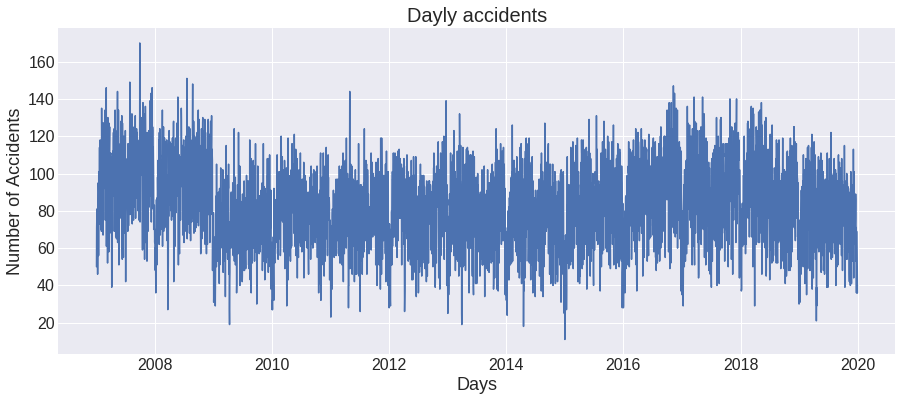

In [29]:
fig = plt.figure()
plt.plot(by_date.date, by_date.accident_count, color='b')
plt.title('Dayly accidents', fontsize =20)
plt.xlabel('Days')
#plt.xticks( ticks, rotation=90)
plt.ylabel('Number of Accidents')
plt.show()

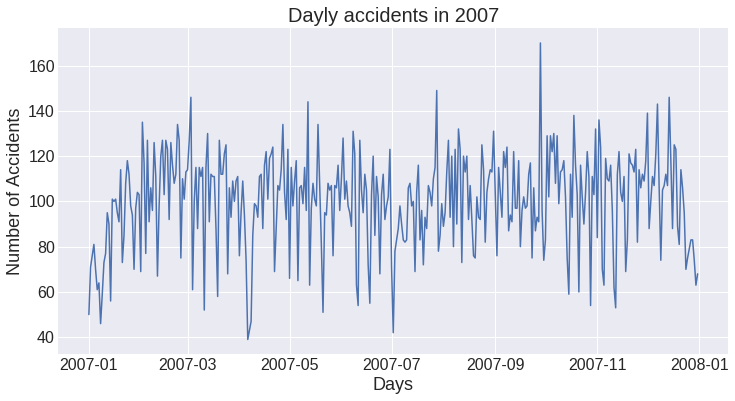

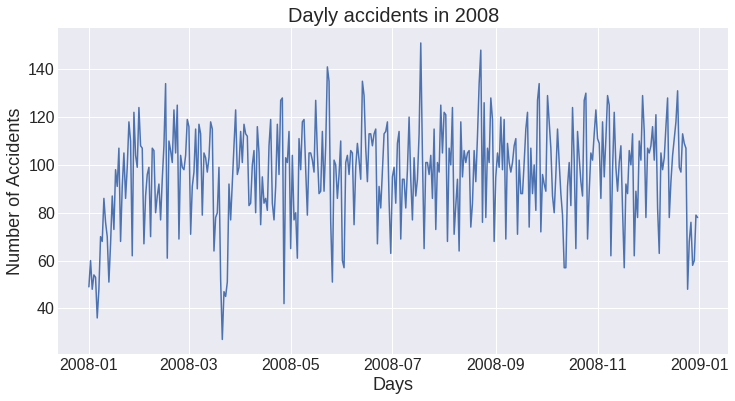

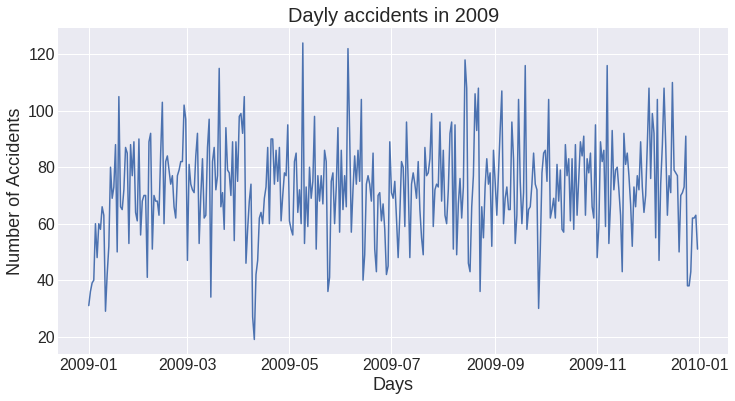

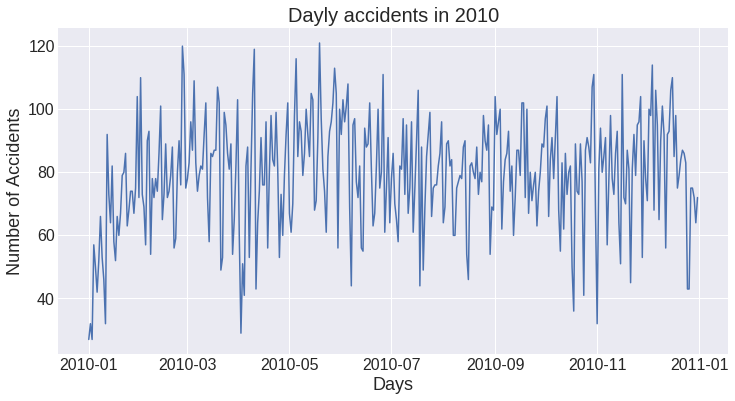

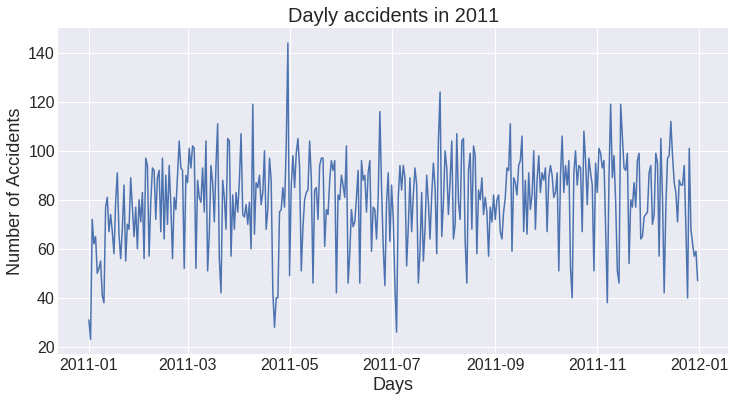

...

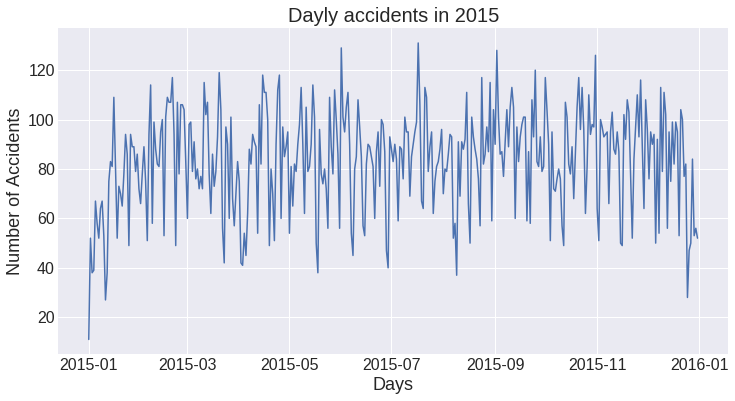

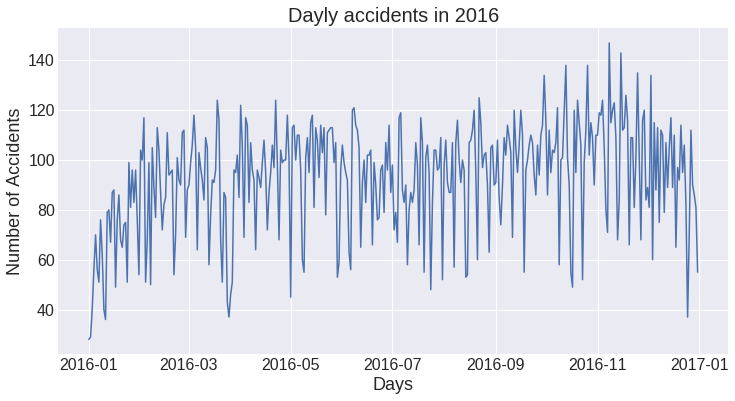

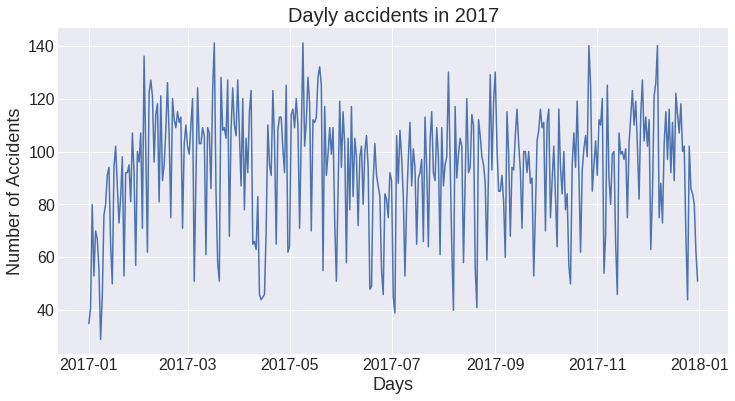

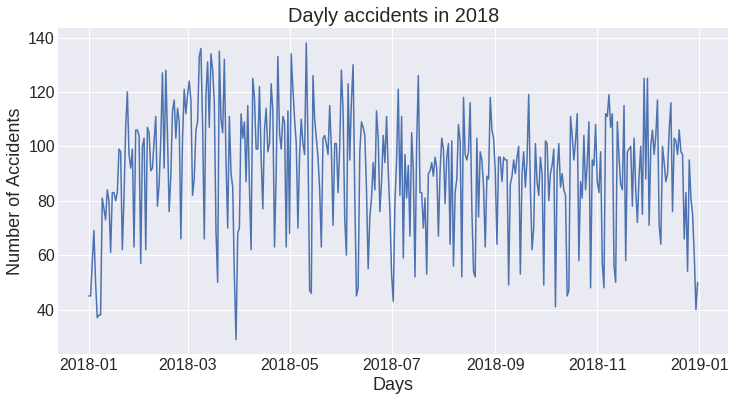

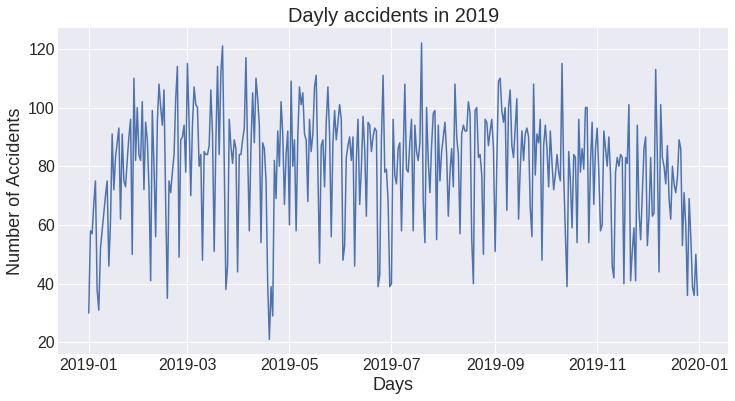

In [30]:
for year in years:
    fig = plt.figure(figsize = (12,6))
    plt.plot(by_date[by_date.date.dt.year == year].date, by_date[by_date.date.dt.year == year].accident_count, color='b')
    plt.title(f'Dayly accidents in {year}', fontsize =20)
    plt.xlabel('Days')
    #plt.xticks( ticks, rotation=90)
    plt.ylabel('Number of Accidents')
    plt.show()
    

### Accidents by year

In [31]:
by_year=accidents['year'].value_counts(sort=True).rename_axis('year').reset_index(name='accident_count').sort_values(by='year').reset_index(drop=True)
by_year

,year,accident_count
0,2007,36514
1,2008,35189
2,2009,26446
3,2010,28977
4,2011,29054
5,2012,29700
6,2013,29716
7,2014,28868
8,2015,30429
9,2016,33992


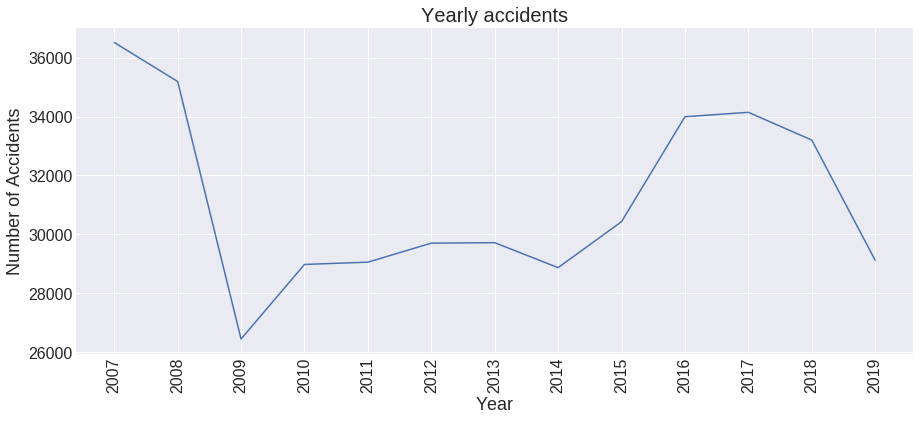

In [32]:
fig = plt.figure()
ticks = [x for x in range(2007, 2020)]
sns.lineplot(by_year.year, by_year.accident_count, color='b')
plt.title('Yearly accidents', fontsize =20)
plt.xlabel('Year')
plt.xticks( ticks, rotation=90)
plt.ylabel('Number of Accidents')
plt.show()

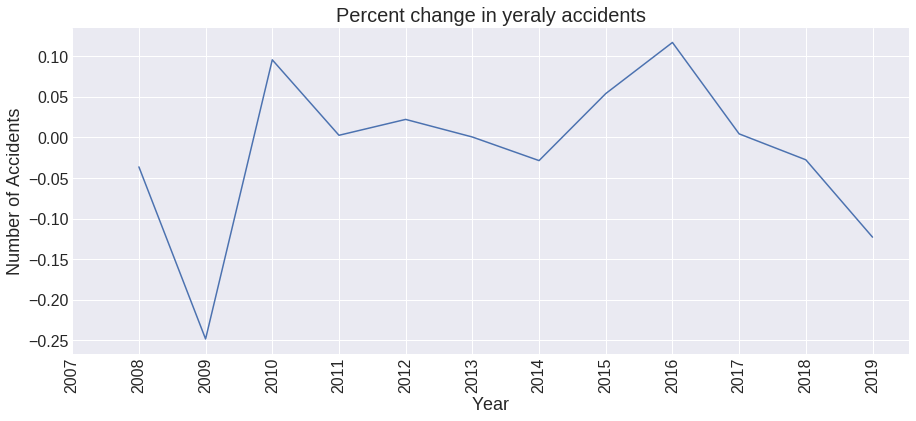

In [33]:
by_year['percent_change'] = by_year.accident_count.pct_change()
sns.lineplot(by_year.year, by_year.percent_change, color='b')
plt.title('Percent change in yeraly accidents', fontsize =20)
plt.xlabel('Year')
plt.xticks( ticks, rotation=90)
plt.ylabel('Number of Accidents')
plt.show()

### Accidents by hour

In [34]:
# Hourly accidents
accidents['hour']=accidents.timestamp.dt.hour
by_hour = accidents[['hour','accident_id']].groupby(['hour']).count().reset_index().sort_values(by='hour')
by_hour = by_hour.reset_index(drop=True)
by_hour.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_hour

,hour,accident_count
0,0,4772
1,1,4035
2,2,3578
3,3,4164
4,4,4620
5,5,10646
6,6,19220
7,7,24824
8,8,22993
9,9,20269


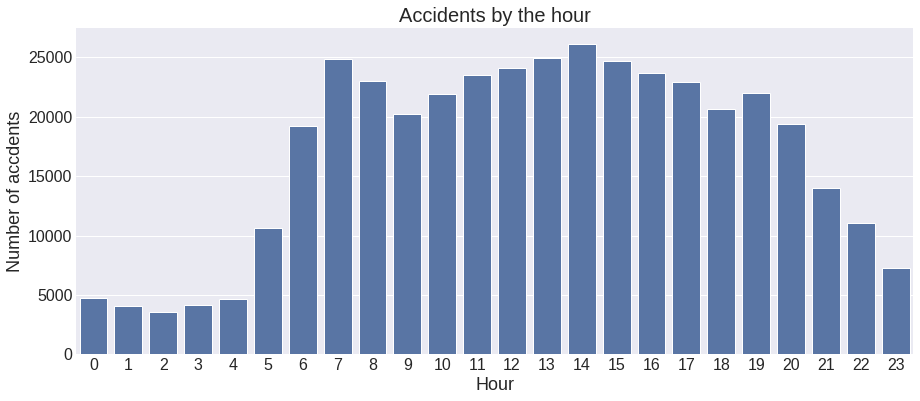

In [35]:
fig = plt.figure()
sns.barplot(by_hour.hour, by_hour.accident_count,color= 'b')
plt.title('Accidents by the hour', fontsize =20)
plt.xlabel('Hour')
plt.ylabel('Number of accdents')
plt.show()

### Accidents by month

In [36]:
accidents['month_name'] = accidents.timestamp.dt.strftime('%b')
accidents['month'] = accidents.timestamp.dt.month
by_month = accidents[['month', 'month_name','accident_id']].groupby(['month','month_name']).count().reset_index().sort_values(by='month')
by_month = by_month.reset_index(drop=True)
by_month.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_month.accident_count = by_month.accident_count/accidents.timestamp.dt.daysinmonth
by_month

,month,month_name,accident_count
0,1,Jan,922.645161
1,2,Feb,1098.766667
2,3,Mar,1225.275862
3,4,Apr,1194.428571
4,5,May,1164.000000
5,6,Jun,1090.233333
6,7,Jul,1078.516129
7,8,Aug,1118.387097
8,9,Sep,1192.965517
9,10,Oct,1257.285714


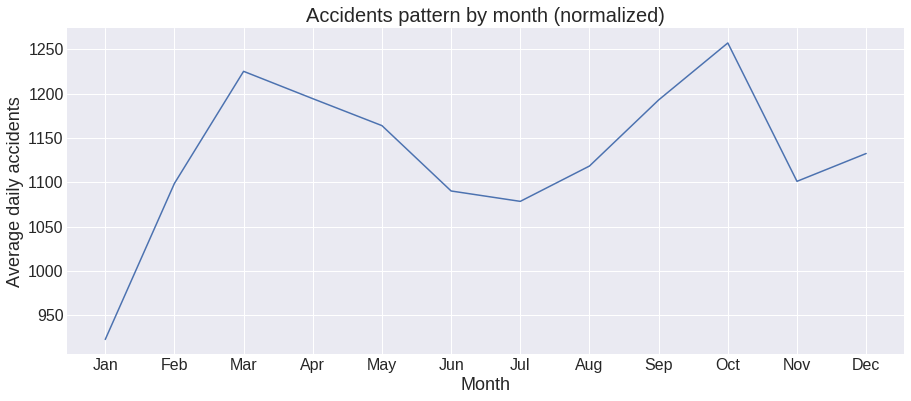

In [37]:
fig = plt.figure()
plt.plot(by_month.month_name, by_month.accident_count, color='b')
plt.title('Accidents pattern by month (normalized)', fontsize=20)
plt.xlabel('Month')
plt.ylabel('Average daily accidents')
plt.show()

### Accidents by day

In [38]:
accidents['day']=accidents.timestamp.dt.day_name()
accidents['day_of_week'] = accidents.timestamp.dt.dayofweek
by_day = accidents[['day','accident_id']].groupby(['day']).count().reset_index().sort_values(by='accident_id', ascending=False)
by_day = by_day.reset_index(drop=True)
by_day.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_day

,day,accident_count
0,Friday,65187
1,Saturday,62916
2,Tuesday,61871
3,Wednesday,60655
4,Thursday,59431
5,Monday,54918
6,Sunday,40370


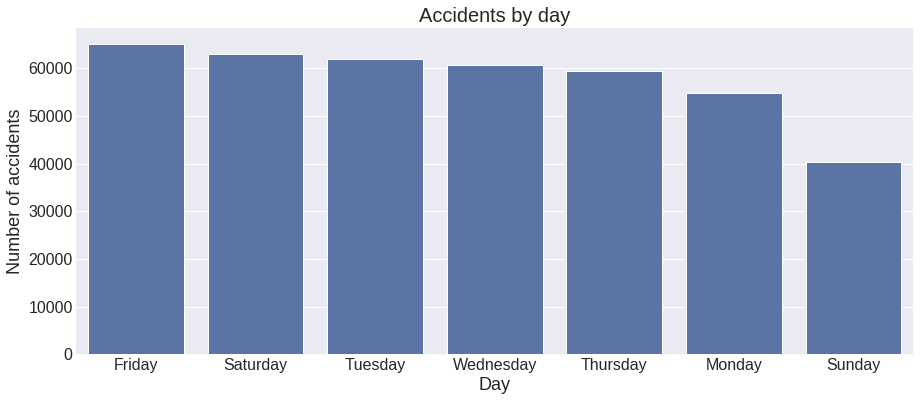

In [39]:
fig = plt.figure()
sns.barplot(by_day.day, by_day.accident_count, color='b')
plt.title('Accidents by day', fontsize=20)
plt.xlabel('Day')
plt.ylabel('Number of accidents')
plt.show()

In [40]:
ct_day_month = pd.crosstab(accidents.month, accidents.day_of_week)
ct_day_month.index = [calendar.month_abbr[x] for x in ct_day_month.index ]
ct_day_month.columns = [calendar.day_abbr[x] for x in ct_day_month.columns]
ct_day_month

,Mon,Tue,Wed,Thu,Fri,Sat,Sun
Jan,4040,4482,4381,4233,4452,4205,2809
Feb,4915,4798,4957,4353,5485,5192,3263
Mar,4582,5458,5174,5267,5862,5723,3467
Apr,5092,5104,5020,4744,5013,5135,3336
May,4677,5505,5438,5533,5924,5509,3498
Jun,3862,5055,4942,4827,5468,5302,3251
Jul,4565,5324,4892,4885,5268,5060,3440
Aug,4570,5096,5307,5080,5793,5420,3404
Sep,4885,5079,4988,5012,5533,5491,3608
Oct,4780,5452,5396,5325,5559,5357,3335


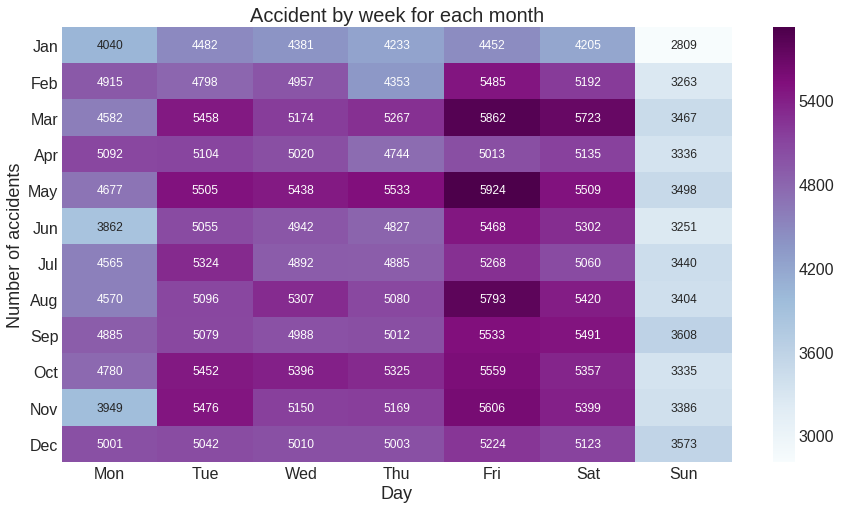

In [41]:
fig = plt.figure(figsize=(15,8))
map1 = sns.heatmap(ct_day_month, annot=True, fmt="d", cmap='BuPu')
plt.title('Accident by week for each month', fontsize=20)
plt.xlabel('Day')
plt.ylabel('Number of accidents')
plt.yticks(rotation=0)
plt.show()

In [42]:
ct_hour_day = pd.crosstab(accidents.hour, accidents.day_of_week)
ct_hour_day.columns = [calendar.day_abbr[x] for x in ct_hour_day.columns]
ct_hour_day

,Mon,Tue,Wed,Thu,Fri,Sat,Sun
hour,,,,,,,
0,410,441,487,596,703,1068,1067
1,346,279,348,448,584,1071,959
2,296,211,284,392,483,908,1004
3,327,231,327,385,498,1127,1269
4,521,467,540,571,669,939,913
5,1594,1658,1665,1687,1782,1316,944
6,2805,3354,3273,3174,3365,1990,1259
7,3708,4299,4385,4148,4038,2831,1415
8,3185,4114,3818,3632,3732,3104,1408


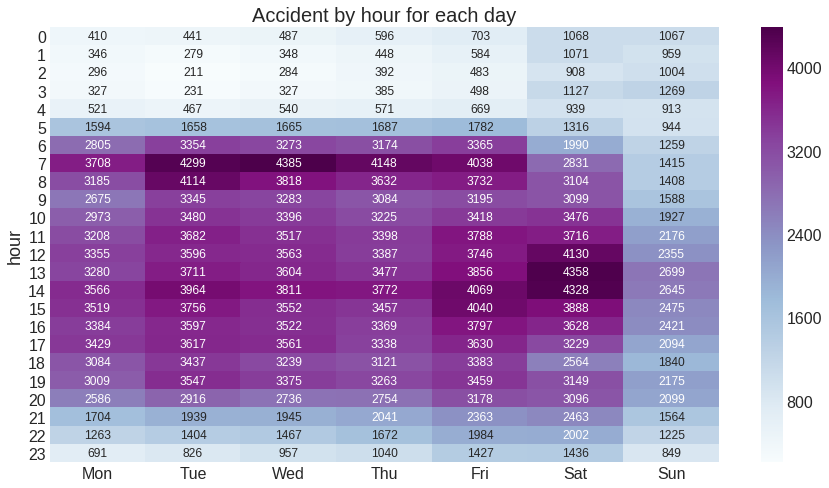

In [43]:
fig = plt.figure(figsize=(15,8))
map1 = sns.heatmap(ct_hour_day, annot=True, fmt="d", cmap='BuPu')
plt.title('Accident by hour for each day', fontsize=20)
plt.yticks(rotation=0)
plt.show()

### By borough

In [44]:
by_borough = accidents[['borough','accident_id']].groupby(['borough']).count().reset_index().sort_values(by='accident_id',ascending=False)
by_borough = by_borough.reset_index(drop=True)
by_borough.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_borough

,borough,accident_count
0,USAQUEN,43738
1,KENNEDY,42410
2,ENGATIVA,41993
3,SUBA,39251
4,FONTIBON,30232
5,PUENTE ARANDA,30015
6,CHAPINERO,29886
7,TEUSAQUILLO,24433
8,BARRIOS UNIDOS,23938
9,LOS MARTIRES,14916


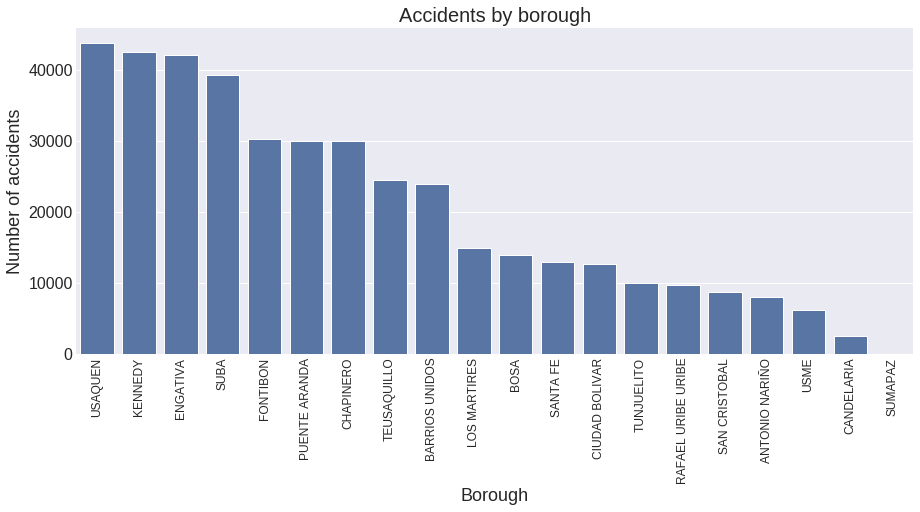

In [45]:
fig = plt.figure()
sns.barplot(by_borough.borough, by_borough.accident_count, color='b')
plt.title('Accidents by borough', fontsize=20)
plt.xlabel('Borough')
plt.xticks(rotation=90, fontsize=12)
plt.ylabel('Number of accidents')
plt.show()

### Accident type

In [46]:
by_type = accidents[['accident_type','accident_id']].groupby(['accident_type']).count().reset_index().sort_values(by='accident_id',ascending=False)
by_type = by_type.reset_index(drop=True)
by_type.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_type

,accident_type,accident_count
0,Crash,338284
1,Run over,45333
2,Occupant fall,8452
3,other,5697
4,Rollover,4824
5,Self injury,2535
6,Fire,40


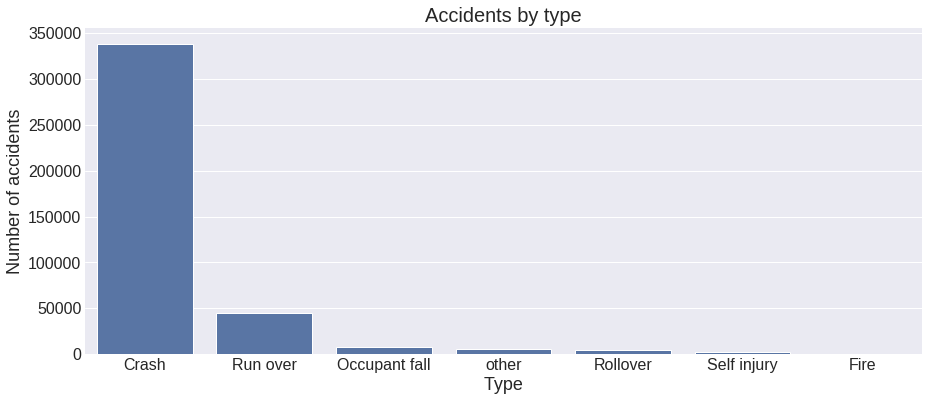

In [47]:
fig = plt.figure()
sns.barplot(by_type.accident_type, by_type.accident_count, color='b')
plt.title('Accidents by type', fontsize=20)
plt.xlabel('Type')
#plt.yscale('log')
plt.ylabel('Number of accidents')
plt.show()

In [48]:
by_severity = accidents[['severity','accident_id']].groupby(['severity']).count().reset_index().sort_values(by='accident_id',ascending=False)
by_severity = by_severity.reset_index(drop=True)
by_severity.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_severity

,severity,accident_count
0,Material damage,269350
1,Injury,130321
2,Fatality,5674


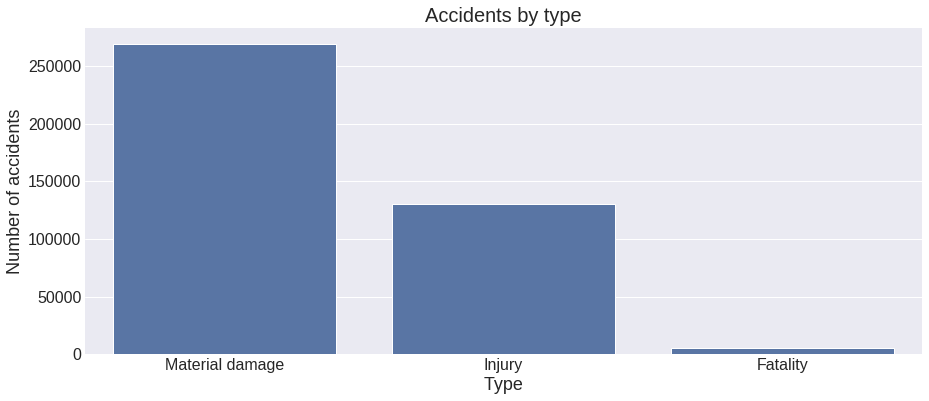

In [49]:
fig = plt.figure()
sns.barplot(by_severity.severity, by_severity.accident_count, color='b')
plt.title('Accidents by type', fontsize=20)
plt.xlabel('Type')
#plt.yscale('log')
plt.ylabel('Number of accidents')
plt.show()

## Geography

### Bogota Map

In [50]:
accident_sample = accidents.sample(frac=0.01, random_state=1)

In [51]:
folium_map = folium.Map(location=[4.624335, -74.083644],
                        zoom_start=13,
                        tiles="openstreetmap")
for row in accident_sample.iterrows():
    marker = folium.CircleMarker(location=[row[1]['y'],row[1]['x']], radius=1, color="red", fill=True)
    marker.add_to(folium_map)

In [52]:
folium_map

In [53]:
borough_file = os.path.join(data_folder, 'poligonos-localidades.geojson')
borough_df = geopandas.read_file(borough_file, driver= "GeoJSON")
borough_df.drop(columns = ['Acto administrativo de la localidad', 'Area de la localidad'], inplace=True)
borough_df.rename(columns={'Nombre de la localidad':'borough', 'Area de la localidad':'area',
                           'Identificador unico de la localidad':'id' }, inplace=True)

In [54]:
borough_info = os.path.join(data_folder, 'localidades.csv')
borough_info = pd.read_csv(borough_info, header=0, dtype='str')
borough_info.area_km2 = borough_info.area_km2.astype('float')
borough_info.population = borough_info.population.astype('int')
borough_info.population_density = borough_info.population_density.astype('float')
borough_info.head()

,id,borough,postal_codes,area_km2,population,population_density
0,01,Usaquén,110111-110151,65.31,501999,7686.40
1,02,Chapinero,110211-110231,38.15,139701,3661.88
2,03,SantaFe,110311-110321,45.17,110048,2436.30
3,04,SanCristóbal,110411-110441,49.09,404697,8243.98
4,05,Usme,110511-110571,215.06,457302,2126.39


In [55]:
borough_df = borough_df.merge(borough_info, how='inner', left_on='id', right_on='id')


In [56]:
borough_df.drop(columns = ['borough_y', 'postal_codes'], inplace=True)
borough_df.rename(columns={'borough_x':'borough'}, inplace=True)

In [57]:
borough_df.columns

Index(['borough', 'id', 'geometry', 'area_km2', 'population',
       'population_density'],
      dtype='object')

In [58]:
set(accidents.borough.unique()) - set(borough_df['borough'].unique())

set()

In [59]:
borough_data = borough_df.merge(by_borough, how='left', left_on='borough', right_on='borough')
borough_data.head(3)

,borough,id,geometry,area_km2,population,population_density,accident_count
0,CIUDAD BOLIVAR,19,"MULTIPOLYGON (((-74.18135 4.58892, -74.18092 4...",130.00,707569,5442.83,12675
1,SUBA,11,"MULTIPOLYGON (((-74.03450 4.82547, -74.03489 4...",100.56,1218513,12117.27,39251
2,RAFAEL URIBE URIBE,18,"MULTIPOLYGON (((-74.12803 4.59254, -74.12829 4...",13.83,374246,27060.44,9730


In [60]:
borough_data['accident_density'] = round(borough_data.accident_count/borough_data.area_km2, 1)

In [61]:
# color scheme
color_map = plt.cm.get_cmap('BuPu', 12)
min_cn, max_cn = by_borough['accident_count'].quantile([0.01,0.99]).apply(round, 2)

colormap = branca.colormap.LinearColormap(
    colors=tuple(map(tuple, color_map(np.linspace(0, 1, 12)))),
    vmin=min_cn,
    vmax=max_cn
)

colormap.caption="Accidents in Bogota by borough"

In [62]:
folium_map = folium.Map(location=[4.500335, -74.083644],
                        zoom_start=10,
                        tiles="openstreetmap")

style_function = lambda x: {
    'fillColor': colormap(x['properties']['accident_count']),
    'color': 'black',
    'weight':2,
    'fillOpacity':0.7
}

bgeo = folium.GeoJson(
    borough_data.to_json(),
    name='Bogota boroughs',
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['borough', 'accident_count'],
        aliases=['Borough', 'Total accidents'], 
        localize=True
    )
).add_to(folium_map)

colormap.add_to(folium_map)
folium_map

In [63]:
# color scheme
color_map = plt.cm.get_cmap('BuPu', 12)
min_cn, max_cn = borough_data['accident_density'].quantile([0.01,0.99]).apply(round, 2)

colormap = branca.colormap.LinearColormap(
    colors=tuple(map(tuple, color_map(np.linspace(0, 1, 12)))),
    vmin=min_cn,
    vmax=max_cn
)

colormap.caption="Accident density in Bogota by borough"

In [64]:
folium_map = folium.Map(location=[4.510335, -74.083644],
                        zoom_start=10,
                        tiles="openstreetmap")

style_function = lambda x: {
    'fillColor': colormap(x['properties']['accident_density']),
    'color': 'black',
    'weight':2,
    'fillOpacity':0.7
}

bgeo = folium.GeoJson(
    borough_data.to_json(),
    name='Bogota boroughs',
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['borough', 'accident_density'],
        aliases=['Borough', 'Accidents per sq. km'], 
        localize=True
    )
).add_to(folium_map)

colormap.add_to(folium_map)
folium_map